In [61]:
# Run this cell if your computer has a 'retina' or high DPI display. It will make the figures look much nicer.
%config InlineBackend.figure_format = 'retina'

In [3]:
# This cell imports libraries that you will need
# Run this.
from matplotlib.pyplot import figure, cm
import numpy as np
import logging
logging.basicConfig(level=logging.DEBUG)

Here is just another example, but this one an abstract noun, "language". Again the model does a pretty good job at finding related words.

In [71]:
# eng1000.find_words_like_vec(eng1000["king"] - eng1000["man"] + eng1000["woman"])

In [5]:
# These are lists of the stories
# Rstories are the names of the training (or Regression) stories, which we will use to fit our models
Rstories = ['alternateithicatom', 'avatar', 'howtodraw', 'legacy', 
            'life', 'myfirstdaywiththeyankees', 'naked', 
            'odetostepfather', 'souls', 'undertheinfluence']

# Rstories = ['alternateithicatom', 'avatar', 'howtodraw', 'legacy']


# Pstories are the test (or Prediction) stories (well, story), which we will use to test our models
Pstories = ['wheretheressmoke']

allstories = Rstories + Pstories

# Load TextGrids
from stimulus_utils import load_grids_for_stories
grids = load_grids_for_stories(allstories)

# Load TRfiles
from stimulus_utils import load_generic_trfiles
trfiles = load_generic_trfiles(allstories)

# Make word and phoneme datasequences
from dsutils import make_word_ds, make_phoneme_ds
wordseqs = make_word_ds(grids, trfiles) # dictionary of {storyname : word DataSequence}
phonseqs = make_phoneme_ds(grids, trfiles) # dictionary of {storyname : phoneme DataSequence}

In [73]:
wordlist = {}
for storyname, wordseq in wordseqs.items():
    wordlist[storyname] = list(wordseq.data)

## Bert

In [74]:
!pip install transformers

Defaulting to user installation because normal site-packages is not writeable


In [6]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import random
# from sklearn.linear_model import Ridge
# from sklearn.model_selection import KFold
from scipy.spatial.distance import cosine
from transformers import AutoTokenizer, AutoModel , BertTokenizer, BertModel
import torch 
# import gensim.downloader as gsd
from math import comb

/home/aayush/.local/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [76]:
bert_tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
bert_model = BertModel.from_pretrained('bert-base-uncased', output_hidden_states=True)

DEBUG:urllib3.connectionpool:Resetting dropped connection: huggingface.co
DEBUG:urllib3.connectionpool:https://huggingface.co:443 "HEAD /bert-base-uncased/resolve/main/vocab.txt HTTP/1.1" 200 0
DEBUG:urllib3.connectionpool:https://huggingface.co:443 "HEAD /bert-base-uncased/resolve/main/config.json HTTP/1.1" 200 0
Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertModel: ['cls.predictions.decoder.weight', 'cls.seq_relationship.bias', 'cls.predictions.bias', 'cls.predictions.transform.dense.weight', 'cls.predictions.transform.LayerNorm.weight', 'cls.seq_relationship.weight', 'cls.predictions.transform.dense.bias', 'cls.predictions.transform.LayerNorm.bias']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from th

In [77]:
CONTEXTS = range(1, 21)

In [7]:
import pickle
from pprint import pprint

In [79]:
# for story in allstories:
#     # Load existing dictionary if file exists, otherwise create new dictionary
#     # CONTEXT_DICT= {}
#     try:
#         with open('contexts_7.p', 'rb') as f:
#             CONTEXT_DICT = dict(pickle.load(f))
#     except FileNotFoundError:
#         CONTEXT_DICT = {}
#     pprint(CONTEXT_DICT.keys())
#     if story not in CONTEXT_DICT.keys() :
#         CONTEXT_DICT[story] = np.zeros((20, len(wordlist[story]), 768))
#         print(story)
#     else:
#       continue
    
#     for context in CONTEXTS:
#         print(context, end=' ')
#         for i in range(1, len(wordlist[story])+1):
#             context_words = wordlist[story][i-context if (i-context)>0 else 0:i]
#             context_string = ' '.join(context_words)
#             lay12_embeddings = []

#             s= bert_tokenizer.encode(context_string, add_special_tokens=True) 
#             input_id = torch.tensor(s).unsqueeze(0)
#             with torch.no_grad():
#                 outputs = bert_model(input_id)
#                 hidden_states = outputs[2][1:]
#             #put the activations from the final layer into the dictionary
#             CONTEXT_DICT[story][context-1, i-1, :] = hidden_states[11][:,-2,:].numpy() # l

#     # Append to the existing file
#     with open('contexts_12.p', 'wb') as f:
#         pickle.dump(CONTEXT_DICT, f)

In [80]:
with open('contexts_7.p', 'rb') as f:
    CONTEXT_DICT = dict(pickle.load(f))

KeyboardInterrupt: 

In [ ]:
# CONTEXT_DICT['alternateithicatom'][0] == CONTEXT_DICT['alternateithicatom'][2]
# print(CONTEXT_DICT['alternateithicatom'].shape)

In [ ]:
# pprint(CONTEXT_DICT)

In [ ]:
dt = CONTEXT_DICT['life']

In [8]:
from tqdm import tqdm

In [ ]:
CONTEXT_DICT = SWAPPED_CONTEXT_DICT

In [ ]:
with open('swapped_contexts_7.p', 'wb') as f:
    pickle.dump(SWAPPED_CONTEXT_DICT, f)

In [83]:
from pprint import pprint

In [10]:
# Project stimuli
from dsutils import make_semantic_model
semanticseqs = dict() # dictionary to hold projected stimuli {story name : projected DataSequence}

In [ ]:
# CONTEXTsemanticseqs['naked'][0].data == CONTEXTsemanticseqs['naked'][1].data

In [ ]:
# print(CONTEXTsemanticseqs['naked'][0].data.shape)

In [ ]:
# print(downsampled_CONTEXTS['naked'][0].shape)

In [ ]:
# print(CONTEXT_Rstim[0].shape)

### Visualizing the combined stimuli
Next you're going to plot some of the feature channels. This is just to see what the feature look like that are going to go into the regression model.

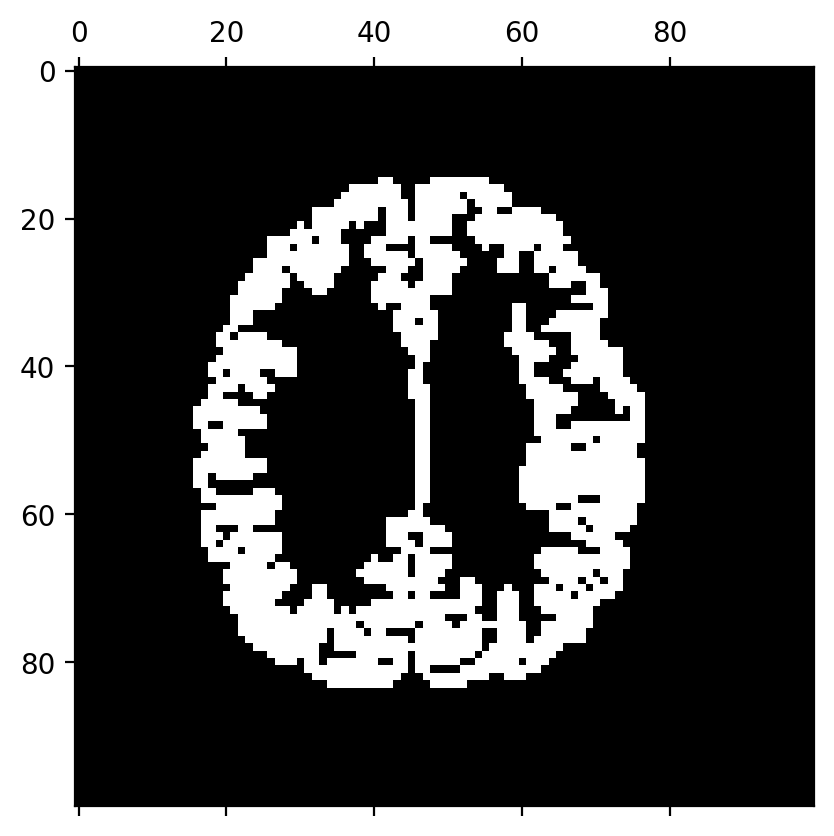

In [ ]:
# Plot one slice of the mask that was used to select the voxels
f = figure()
ax = f.add_subplot(1,1,1)
ax.matshow(mask[16], interpolation="nearest", cmap=cm.gray) # show the 17th slice of the mask

### Visualizing correlations across the brain
Let's start with a supposition: the correlation should not be high everywhere, even if this is a good model of how the brain represents the semantic content of speech. There are parts of the brain that just don't respond to speech, so the correlation should be low in those areas. There are other parts of the brain that respond to speech, but maybe don't represent semantic information, so the correlation should be low in those areas as well.

But let's begin by plotting a histogram of the correlations across the entire brain. This will show generally whether the model is working well or not.

If the semantic features didn't capture anything about brain activity, then we would expect the histogram to be symmetric and centered around zero. But here we see that it's highly skewed, with lots of positive values. This looks good! This model is working!

Next, let's plot a mosaic of the correlations across the brain, as we plotted the mask earlier.

#### 3D visualization of correlations
In the mosaic we can see that there seem to be some concentrated areas of high correlation. But it's hard to say where in the brain those areas are based on the mosaic. So next you're going to create a fancy 3D visualization of the correlations using pyCortex.

Once you've opened the viewer you'll be presented with a 3D view of the brain with colors showing the correlations. White outlines and labels show the locations of known brain areas (motor, somatosensory, visual, and some language areas). Drag around with your left mouse button to rotate the view, and the right mouse button to zoom in or out. 

By default you'll see a view of the cortex as it looks in reality: folded and convoluted. To better see parts of the brain that are hidden down in the folds, you can press "i" to see an inflated view (or drag the "Mix" slider at the bottom of the screen to the middle). This helps to see the data, but you will still need to rotate the brain to see all of it. To make the entire cortex visible at once, you can press "f" to see a flattened view. To create this view we cut the cortical surface at a few locations, and then flattened it out so that it can all be seen at once (but this introduces some distortions).

In [2]:
!pip install  pycortex --user




In [96]:
!pip install Inkscape

Defaulting to user installation because normal site-packages is not writeable
ERROR: Could not find a version that satisfies the requirement Inkscape (from versions: none)
ERROR: No matching distribution found for Inkscape


In [4]:
import pickle


In [15]:
with open('embedding_corr', 'rb') as f:
    embedding_corr = dict(pickle.load(f))
corr = embedding_corr['corr']  

In [21]:
corr

array([ 0.05064817,  0.01788456, -0.01548662, ...,  0.07615076,
       -0.04228578,  0.03606779])

In [22]:

with open('layer_4', 'rb') as f:
    corr4 = list(pickle.load(f))

with open('layer_8', 'rb') as f:
    corr8 = list(pickle.load(f))

with open('layer_12', 'rb') as f:
    corr12= list(pickle.load(f))



In [25]:
with open('embedding_corr', 'rb') as f:
    embedding_corr = dict(pickle.load(f))
embed_corr = embedding_corr['corr']  

In [26]:
with open('layer_8', 'rb') as f:
    corr8 = list(pickle.load(f))


In [6]:
corr_thresh =[]
corr_thresh4 =np.array(corr_thresh)
corr_thresh8 =np.array(corr_thresh)
corr_thresh12 =np.array(corr_thresh)

for i in corr4[19]:
    if i> 0:
        corr_thresh4 = np.append(corr_thresh4,i)
    else:
        corr_thresh4 = np.append(corr_thresh4,0)

for i in corr8[19]:
    if i> 0:
        corr_thresh8 = np.append(corr_thresh8,i)
    else:
        corr_thresh8 = np.append(corr_thresh8,0)

for i in corr12[19]:
    if i> 0:
        corr_thresh12 = np.append(corr_thresh12,i)
    else:
        corr_thresh12 = np.append(corr_thresh12,0)
        


In [97]:
corr_thresh =[]
embed_corr_thresh =np.array(corr_thresh)
corr_thresh8 =np.array(corr_thresh)

for i in embed_corr:
    if i> 0.15:
        embed_corr_thresh = np.append(embed_corr_thresh,i)
    else:
        embed_corr_thresh = np.append(embed_corr_thresh,0)

for i in corr8[19]:
    if i> 0.15:
        corr_thresh8 = np.append(corr_thresh8,i)
    else:
        corr_thresh8 = np.append(corr_thresh8,0)

diff_corr =  corr_thresh8 - embed_corr_thresh

    


In [63]:
len(diff_corr)


37226

In [122]:
#iterate through corr_thresh8 for every context, store the maximum value as well as the context to which it belongs

maxi_corr_thresh8 =np.array(corr_thresh)
maxi = corr8[0][0]
ind = 0
context_corr = []
context_ind = []
for i in range(len(diff_corr)):
    maxi = corr8[0][i]
    ind = 0
    for j in range(len(corr8)):
        if(maxi < corr8[j][i]):
            maxi = corr8[j][i]
            ind = j
    context_corr.append(maxi)
    context_ind.append(ind)
    




In [123]:
context_ind = np.array(context_ind)

In [124]:
context_ind = context_ind+1


In [125]:
ind_norm = (context_ind-np.min(context_ind))/(np.max(context_ind)-np.min(context_ind))

In [126]:
ind_norm.min()

0.0

In [127]:
corr_thresh =[]
context_corr_thresh = np.array(corr_thresh)
for i in range(len(context_corr)):
    if i> 0.4:
        context_corr_thresh = np.append(context_corr_thresh,context_corr[i])
    else:
        context_corr_thresh = np.append(context_corr_thresh,0)
        ind_norm[i] = 0
    
    

In [129]:
ind_norm

14395.526315789475

In [105]:
context_ind

array([ 0, 17, 14, ..., 16,  5,  5])

In [82]:
context_corr_thresh

array([0., 0., 0., ..., 0., 0., 0.])

In [59]:
maxi_list = np.array(corr_thresh)

for i in range(len(embed_corr_thresh)):
    maxi_list = np.append(maxi_list, max(embed_corr_thresh[i],corr_thresh8[i]))



2128.7593057386166

In [98]:
import cortex
import numpy as np
import matplotlib.pyplot as plt

corrvol_diff = cortex.Volume(diff_corr, "S1", "fullhead", mask=mask, vmin= -0.5, vmax=0.5, cmap='BuBkRd', threshold=0.4, )
cortex.webshow(corrvol_diff, port=8889, open_browser=False)

Started server on port 8889


Exception in thread Thread-24:
Traceback (most recent call last):
  File "/usr/lib/python3.10/threading.py", line 1016, in _bootstrap_inner


    self.run()
  File "/usr/local/lib/python3.10/dist-packages/cortex/webgl/serve.py", line 289, in run
    self.server.listen(self.port)
  File "/home/aayush/.local/lib/python3.10/site-packages/tornado/tcpserver.py", line 183, in listen


<WebApp(Thread-24, started 140608675329600)>

    sockets = bind_sockets(
  File "/home/aayush/.local/lib/python3.10/site-packages/tornado/netutil.py", line 162, in bind_sockets
    sock.bind(sockaddr)
OSError: [Errno 98] Address already in use


array([[[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]],

       [[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]],

       [[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, Fal

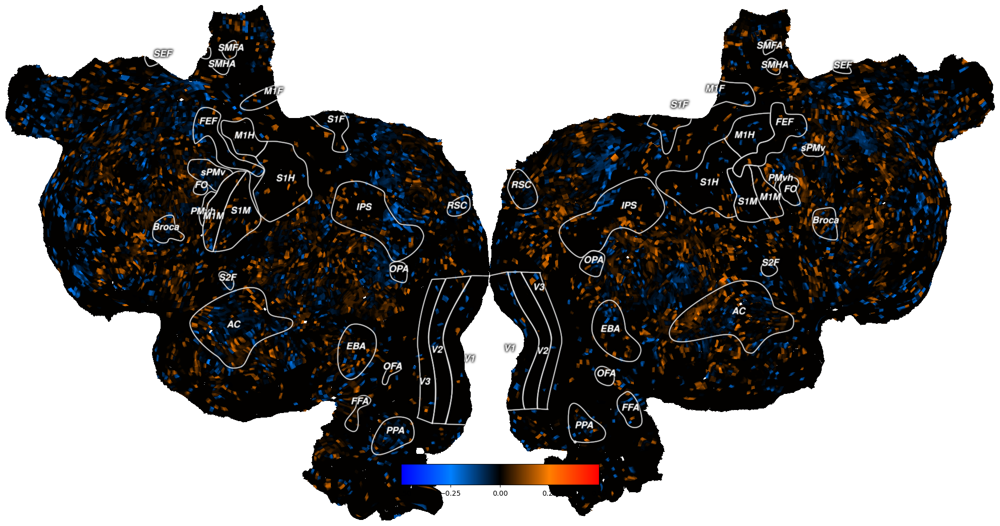

In [99]:
cortex.quickshow(corrvol_diff, with_rois=True, with_labels=True, colorbar_ticks= [-0.5, -0.25, 0, 0.25,0.5], with_borders= True, );


In [10]:
import cortex
import numpy as np
import matplotlib.pyplot as plt
# subject = "S1"
# xfm = "fullhead"

# test_data1 = np.arange(31 * 100 * 100).reshape((31, 100, 100), order='C')
# test_data2 = np.arange(31 * 100 * 100).reshape((31, 100, 100), order='F')

corrvol4 = cortex.Volume(corr_thresh4, "S1", "fullhead", mask=mask, vmin=0, vmax=0.5, cmap='hot', threshold=0.4)
cortex.webshow(corrvol4, port=8889, open_browser=False)

corrvol8 = cortex.Volume(corr_thresh8, "S1", "fullhead", mask=mask, vmin=0, vmax=0.5, cmap='hot', threshold=0.4)
cortex.webshow(corrvol8, port=8889, open_browser=False)

corrvol12 = cortex.Volume(corr_thresh12, "S1", "fullhead", mask=mask, vmin=0, vmax=0.5, cmap='hot', threshold=0.4)
cortex.webshow(corrvol12, port=8889, open_browser=False)

# vol_data = cortex.Volume2D(test_data1, test_data2, subject, xfm)
# cortex.quickshow(vol_data, with_colorbar=False)
# plt.show()


Started server on port 8889


Started server on port 8889


Exception in thread Thread-6:
Traceback (most recent call last):
  File "/usr/lib/python3.10/threading.py", line 1016, in _bootstrap_inner
    self.run()
  File "/usr/local/lib/python3.10/dist-packages/cortex/webgl/serve.py", line 289, in run
    self.server.listen(self.port)
  File "/home/aayush/.local/lib/python3.10/site-packages/tornado/tcpserver.py", line 183, in listen
    sockets = bind_sockets(
  File "/home/aayush/.local/lib/python3.10/site-packages/tornado/netutil.py", line 162, in bind_sockets
    sock.bind(sockaddr)
OSError: [Errno 98] Address already in use


Started server on port 8889


Exception in thread Thread-7:
Traceback (most recent call last):
  File "/usr/lib/python3.10/threading.py", line 1016, in _bootstrap_inner
    self.run()
  File "/usr/local/lib/python3.10/dist-packages/cortex/webgl/serve.py", line 289, in run
    self.server.listen(self.port)
  File "/home/aayush/.local/lib/python3.10/site-packages/tornado/tcpserver.py", line 183, in listen
    sockets = bind_sockets(
  File "/home/aayush/.local/lib/python3.10/site-packages/tornado/netutil.py", line 162, in bind_sockets
    sock.bind(sockaddr)
OSError: [Errno 98] Address already in use


<WebApp(Thread-7, started 140608675329600)>

In [ ]:
# View 3D model
# You will need to change where it says SERVERIP below to the IP you are connected to
from IPython.display import HTML
HTML("<a target='_blank' href='http://127.0.0.1/:8889'>Click here for viewer</a>")

DEBUG:PIL.PngImagePlugin:STREAM b'IHDR' 16 13
DEBUG:PIL.PngImagePlugin:STREAM b'pHYs' 41 9
DEBUG:PIL.PngImagePlugin:STREAM b'tEXt' 62 25
DEBUG:PIL.PngImagePlugin:STREAM b'IDAT' 99 8192
DEBUG:matplotlib.colorbar:locator: <matplotlib.ticker.FixedLocator object at 0x7f093dea9990>
DEBUG:PIL.PngImagePlugin:STREAM b'IHDR' 16 13
DEBUG:PIL.PngImagePlugin:STREAM b'pHYs' 41 9
DEBUG:PIL.PngImagePlugin:STREAM b'tEXt' 62 25
DEBUG:PIL.PngImagePlugin:STREAM b'IDAT' 99 8192
DEBUG:matplotlib.colorbar:locator: <matplotlib.ticker.FixedLocator object at 0x7f093dea81c0>
DEBUG:PIL.PngImagePlugin:STREAM b'IHDR' 16 13
DEBUG:PIL.PngImagePlugin:STREAM b'pHYs' 41 9
DEBUG:PIL.PngImagePlugin:STREAM b'tEXt' 62 25
DEBUG:PIL.PngImagePlugin:STREAM b'IDAT' 99 8192
DEBUG:matplotlib.colorbar:locator: <matplotlib.ticker.FixedLocator object at 0x7f0936f94f40>


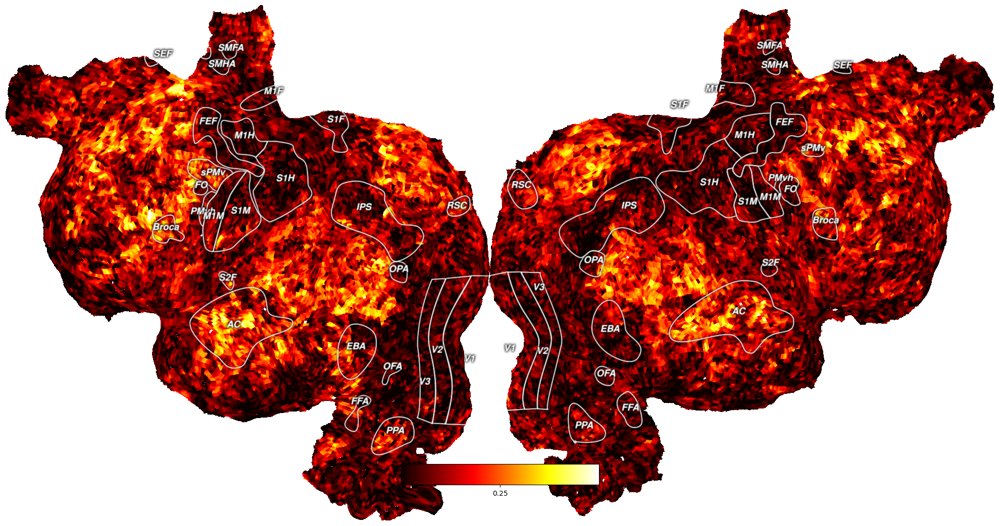

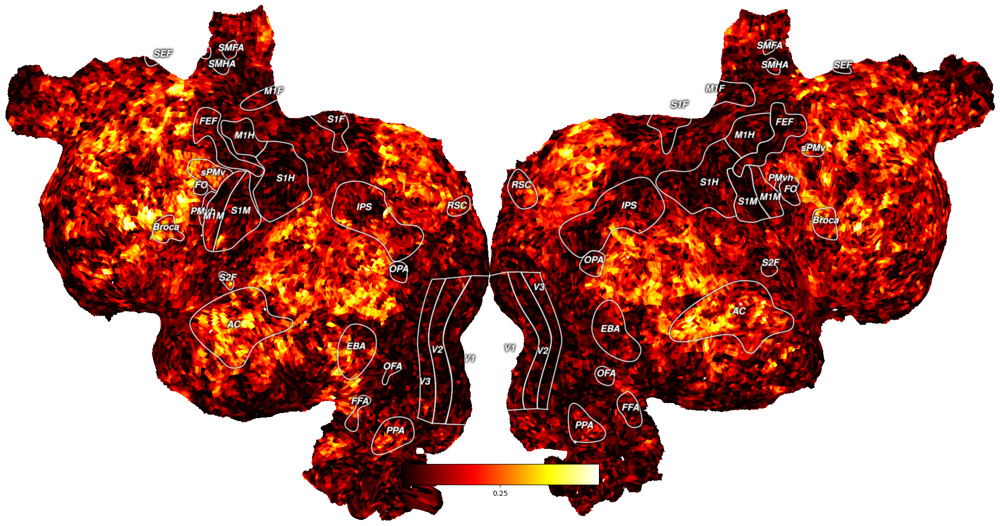

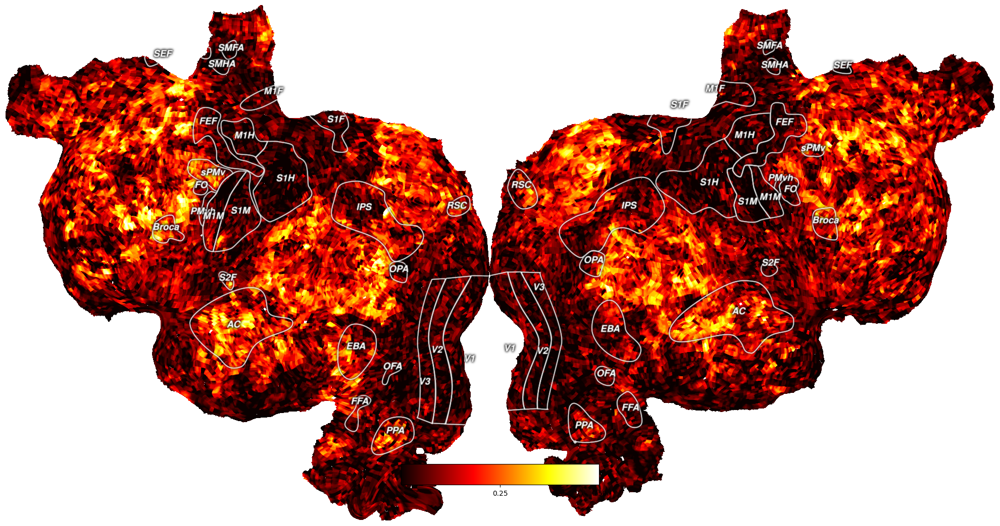

In [ ]:
# Plot correlation flatmap
cortex.quickshow(corrvol4, with_rois=True, with_labels=True, colorbar_ticks= [0.25,0.5]);
cortex.quickshow(corrvol8, with_rois=True, with_labels=True, colorbar_ticks= [0.25,0.5]);
cortex.quickshow(corrvol12, with_rois=True, with_labels=True, colorbar_ticks= [0.25,0.5]);

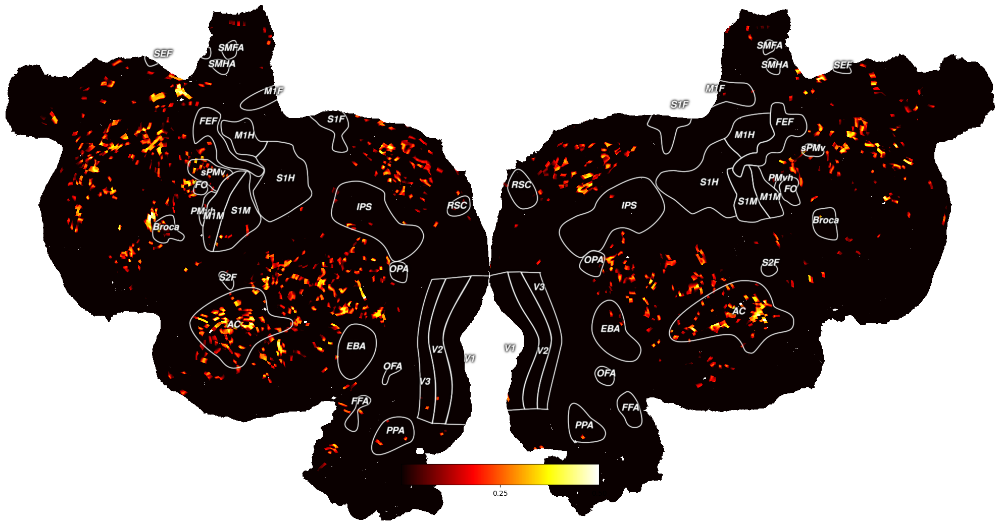

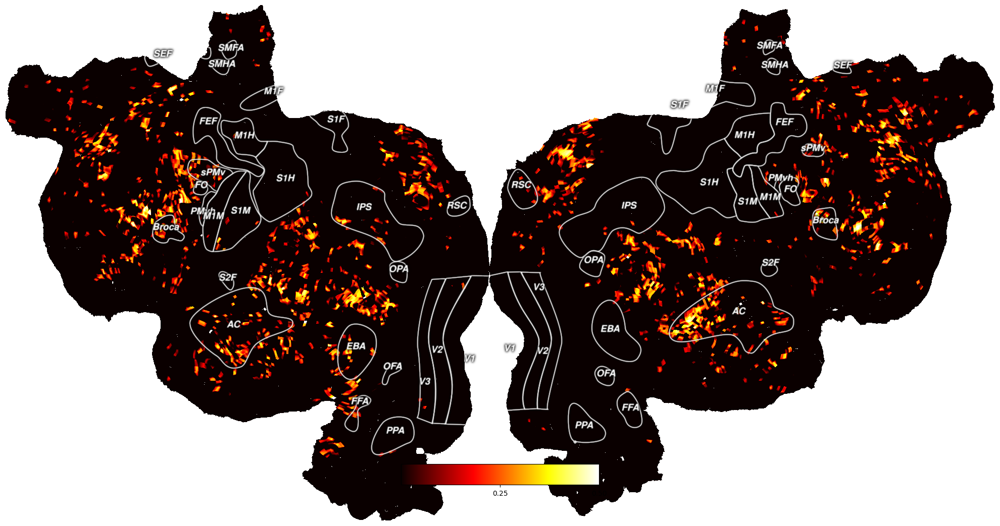

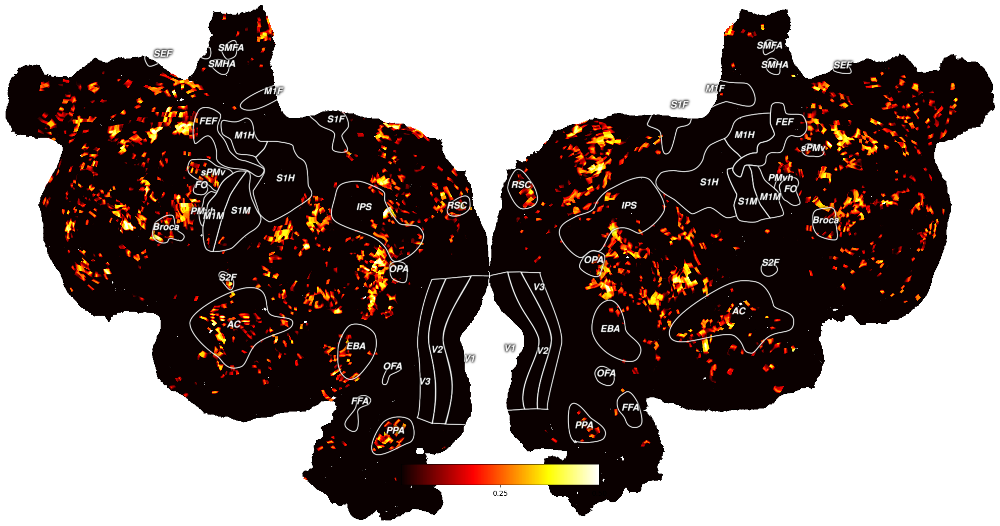

In [13]:
import cortex
from cortex import Volume


corr_thresh =[]
corr_thresh4 =np.array(corr_thresh)
corr_thresh8 =np.array(corr_thresh)
corr_thresh12 =np.array(corr_thresh)

final_corr_thresh = np.array(corr_thresh)

# for j in range(20):
j=19
for i in corr4[j]:
    if i> 0.25:
        corr_thresh4 = np.append(corr_thresh4,i)
    else:
        corr_thresh4 = np.append(corr_thresh4,0)

for i in corr8[j]:
    if i> 0.25:
        corr_thresh8 = np.append(corr_thresh8,i)
    else:
        corr_thresh8 = np.append(corr_thresh8,0)

for i in corr12[j]:
    if i> 0.25:
        corr_thresh12 = np.append(corr_thresh12,i)
    else:
        corr_thresh12 = np.append(corr_thresh12,0)

for i in range(len(corr_thresh4)):
    if corr_thresh12[i] == max(corr_thresh12[i], corr_thresh4[i], corr_thresh8[i]):
        corr_thresh8[i] =0
        corr_thresh4[i] =0

    elif corr_thresh8[i] == max(corr_thresh12[i], corr_thresh4[i], corr_thresh8[i]):
        corr_thresh12[i] =0
        corr_thresh4[i] =0
    else:
        corr_thresh8[i] =0
        corr_thresh12[i] =0

        

    

corrvol4 = cortex.Volume(corr_thresh4, "S1", "fullhead", mask=mask, vmin=0, vmax=0.5, cmap='hot', threshold=0.4)
# cortex.webshow(corrvol4, port=8889, open_browser=False)

corrvol8 = cortex.Volume(corr_thresh8, "S1", "fullhead", mask=mask, vmin=0, vmax=0.5, cmap='hot', threshold=0.4)
# cortex.webshow(corrvol8, port=8889, open_browser=False)

corrvol12 = cortex.Volume(corr_thresh12, "S1", "fullhead", mask=mask, vmin=0, vmax=0.5, cmap='hot', threshold=0.4)
# cortex.webshow(corrvol12, port=8889, open_browser=False)

cortex.quickshow(corrvol4, with_rois=True, with_labels=True, colorbar_ticks= [0.25,0.5]);
cortex.quickshow(corrvol8, with_rois=True, with_labels=True, colorbar_ticks= [0.25,0.5]);
cortex.quickshow(corrvol12, with_rois=True, with_labels=True, colorbar_ticks= [0.25,0.5]);
            

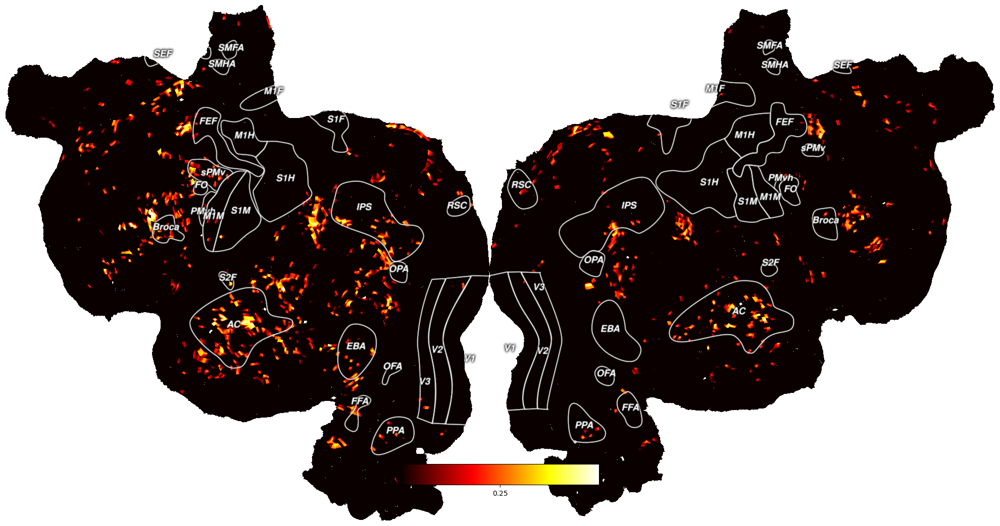

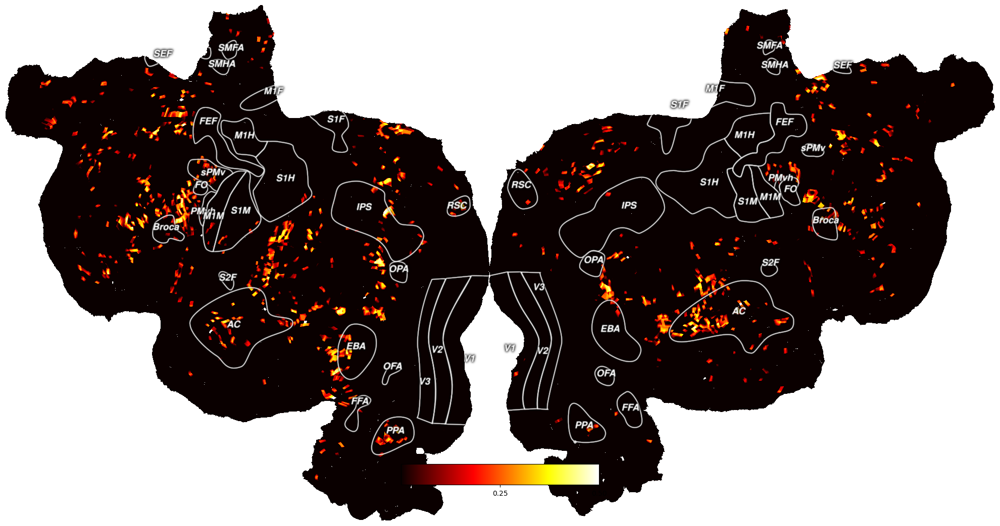

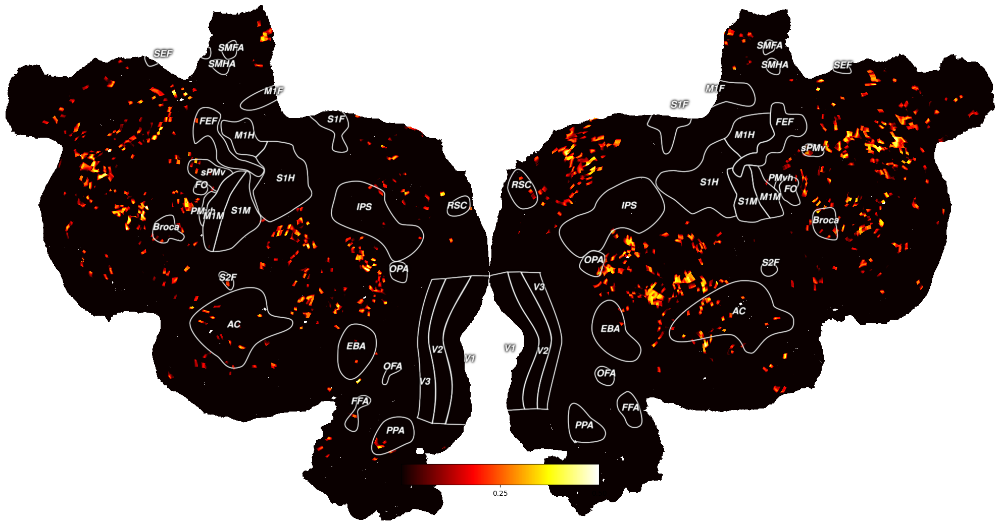

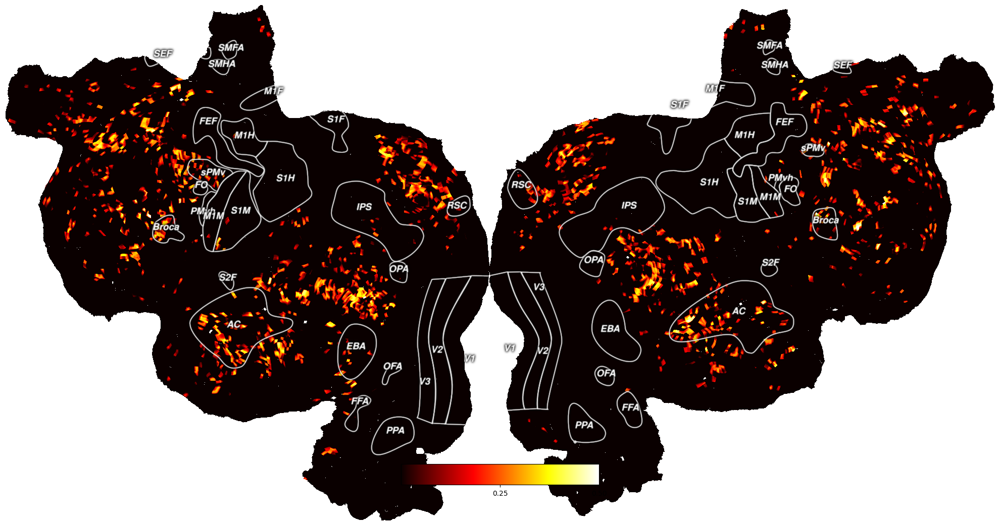

In [135]:
corr_thresh =[]
corr_thresh5 =np.array(corr_thresh)
corr_thresh10 =np.array(corr_thresh)
corr_thresh15 =np.array(corr_thresh)
corr_thresh20 =np.array(corr_thresh)

final_corr_thresh = np.array(corr_thresh)

# for j in range(20):
j=4
for i in corr8[j]:
    if i> 0.25:
        corr_thresh5 = np.append(corr_thresh5,i)
    else:
        corr_thresh5 = np.append(corr_thresh5,0)

j=9
for i in corr8[j]:
    if i> 0.25:
        corr_thresh10 = np.append(corr_thresh10,i)
    else:
        corr_thresh10 = np.append(corr_thresh10,0)
j=14
for i in corr8[j]:
    if i> 0.25:
        corr_thresh15 = np.append(corr_thresh15,i)
    else:
        corr_thresh15 = np.append(corr_thresh15,0)
j=19
for i in corr8[j]:
    if i> 0.25:
        corr_thresh20 = np.append(corr_thresh20,i)
    else:
        corr_thresh20 = np.append(corr_thresh20,0)


for i in range(len(corr_thresh4)):
    if corr_thresh20[i] == max(corr_thresh20[i], corr_thresh15[i], corr_thresh10[i], corr_thresh5[i]):
        corr_thresh15[i] =0
        corr_thresh10[i] =0
        corr_thresh5[i] =0

    elif corr_thresh15[i] == max(corr_thresh20[i], corr_thresh15[i], corr_thresh10[i], corr_thresh5[i]):
        corr_thresh20[i] =0
        corr_thresh10[i] =0
        corr_thresh5[i] =0

    elif corr_thresh10[i] == max(corr_thresh20[i], corr_thresh15[i], corr_thresh10[i], corr_thresh5[i]):
        corr_thresh15[i] =0
        corr_thresh20[i] =0
        corr_thresh5[i] =0
    else:
        corr_thresh15[i] =0
        corr_thresh10[i] =0
        corr_thresh20[i] =0

    

corrvol5 = cortex.Volume(corr_thresh5, "S1", "fullhead", mask=mask, vmin=0, vmax=0.5, cmap='hot', threshold=0.4)
# cortex.webshow(corrvol4, port=8889, open_browser=False)

corrvol10 = cortex.Volume(corr_thresh10, "S1", "fullhead", mask=mask, vmin=0, vmax=0.5, cmap='hot', threshold=0.4)
# cortex.webshow(corrvol8, port=8889, open_browser=False)

corrvol15 = cortex.Volume(corr_thresh15, "S1", "fullhead", mask=mask, vmin=0, vmax=0.5, cmap='hot', threshold=0.4)
# cortex.webshow(corrvol12, port=8889, open_browser=False)

corrvol20 = cortex.Volume(corr_thresh20, "S1", "fullhead", mask=mask, vmin=0, vmax=0.5, cmap='hot', threshold=0.4)


cortex.quickshow(corrvol5, with_rois=True, with_labels=True, colorbar_ticks= [0.25,0.5]);
cortex.quickshow(corrvol10, with_rois=True, with_labels=True, colorbar_ticks= [0.25,0.5]);
cortex.quickshow(corrvol15, with_rois=True, with_labels=True, colorbar_ticks= [0.25,0.5]);
cortex.quickshow(corrvol20, with_rois=True, with_labels=True, colorbar_ticks= [0.25,0.5]);


### 